# Imports

#### Loading the data from kaggle

In [153]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kundanbedmutha/exam-score-prediction-dataset")

print("Path to dataset files:", path)

Path to dataset files: /home/ender/.cache/kagglehub/datasets/kundanbedmutha/exam-score-prediction-dataset/versions/2


In [154]:
path

'/home/ender/.cache/kagglehub/datasets/kundanbedmutha/exam-score-prediction-dataset/versions/2'

#### Actual imports

In [155]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import scipy
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline 
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from scipy.stats import loguniform

# Data Processing

In [156]:
df_raw = pd.read_csv(f"{path}/Exam_Score_Prediction.csv")

In [157]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   student_id        20000 non-null  int64  
 1   age               20000 non-null  int64  
 2   gender            20000 non-null  object 
 3   course            20000 non-null  object 
 4   study_hours       20000 non-null  float64
 5   class_attendance  20000 non-null  float64
 6   internet_access   20000 non-null  object 
 7   sleep_hours       20000 non-null  float64
 8   sleep_quality     20000 non-null  object 
 9   study_method      20000 non-null  object 
 10  facility_rating   20000 non-null  object 
 11  exam_difficulty   20000 non-null  object 
 12  exam_score        20000 non-null  float64
dtypes: float64(4), int64(2), object(7)
memory usage: 2.0+ MB


In [158]:
df_raw

,student_id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty,exam_score
0,1,17,male,diploma,2.78,92.9,yes,7.4,poor,coaching,low,hard,58.9
1,2,23,other,bca,3.37,64.8,yes,4.6,average,online videos,medium,moderate,54.8
2,3,22,male,b.sc,7.88,76.8,yes,8.5,poor,coaching,high,moderate,90.3
3,4,20,other,diploma,0.67,48.4,yes,5.8,average,online videos,low,moderate,29.7
4,5,20,female,diploma,0.89,71.6,yes,9.8,poor,coaching,low,moderate,43.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19997,18,other,bba,6.50,71.3,yes,5.0,good,self-study,low,easy,86.5
19996,19998,18,male,b.com,3.71,41.6,no,5.9,average,coaching,medium,moderate,60.9
19997,19999,19,other,diploma,7.88,68.2,yes,4.6,poor,group study,low,easy,64.5
19998,20000,19,male,bba,4.60,76.3,no,6.1,good,self-study,medium,moderate,79.0


### Mapping, assigning strings to_numeric

Dropping not necessary columns 

In [159]:
df_raw.drop(labels=["course", "study_method", "facility_rating", "student_id"], axis=1, inplace=True)

In [160]:
df = df_raw.copy()

mapping_gender = {"male" : 0, "other" : 1, "female" : 2}
df['gender'] = df_raw['gender'].map(mapping_gender)

mapping_internet_acc = {"yes" : 1, "no" : 0}
df['internet_access'] = df_raw['internet_access'].map(mapping_internet_acc)

mapping_sleep_q = {"poor" : 0, "average" : 1, "good" : 2}
df['sleep_quality'] = df_raw['sleep_quality'].map(mapping_sleep_q)

#mapping_study_m = {"coaching" : 0, "online videos" : 1, "mixed" : 2, "self-study" : 3, "group study" : 4}
#df['study_method'] : df_raw['study_method'].map(mapping_study_m)

mapping_exam_d = {"easy" : 0, "moderate" : 1, "hard" : 2}
df['exam_difficulty'] =  df_raw['exam_difficulty'].map(mapping_exam_d)

In [161]:
df.head()

,age,gender,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,exam_difficulty,exam_score
0,17,0,2.78,92.9,1,7.4,0,2,58.9
1,23,1,3.37,64.8,1,4.6,1,1,54.8
2,22,0,7.88,76.8,1,8.5,0,1,90.3
3,20,1,0.67,48.4,1,5.8,1,1,29.7
4,20,2,0.89,71.6,1,9.8,0,1,43.7


In [162]:
df_raw.head()

,age,gender,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,exam_difficulty,exam_score
0,17,male,2.78,92.9,yes,7.4,poor,hard,58.9
1,23,other,3.37,64.8,yes,4.6,average,moderate,54.8
2,22,male,7.88,76.8,yes,8.5,poor,moderate,90.3
3,20,other,0.67,48.4,yes,5.8,average,moderate,29.7
4,20,female,0.89,71.6,yes,9.8,poor,moderate,43.7


Dropping unnecessary columns

# Graphs / Plots / Analyzing data

#### Heatmap

In [16]:
df_correlated = df.corr()

Text(0.5, 1.0, 'Correlations')

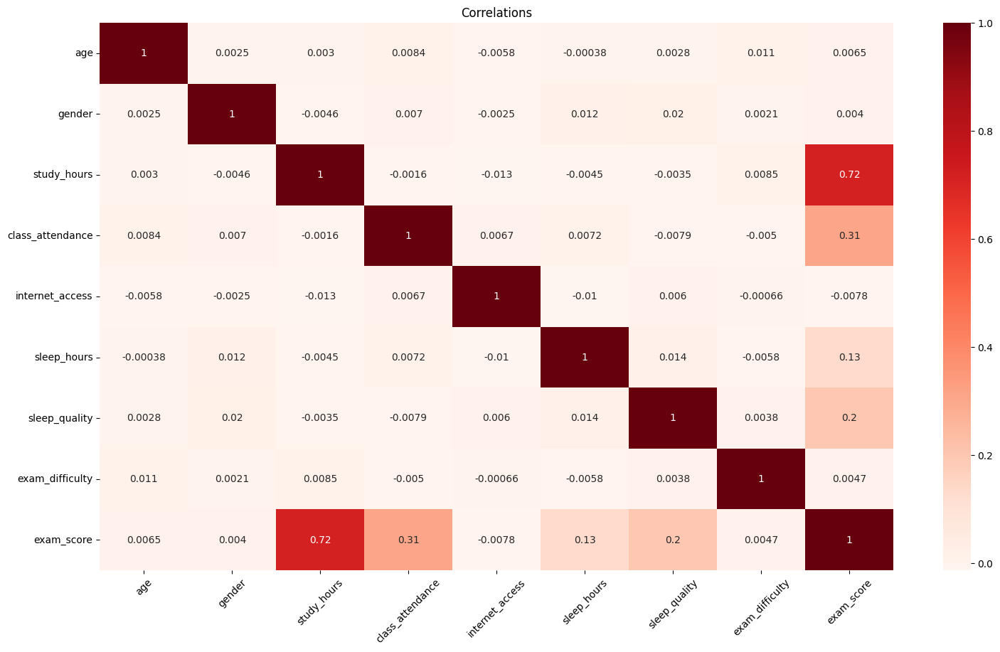

In [17]:
plt.figure(figsize=(18, 10))
sns.heatmap(df_correlated, fmt='.2g', cmap="Reds", annot=True)
plt.xticks(rotation=45)
plt.title("Correlations")

Damn, no comment, we can see that actually study hours has a great effect on the exam scores, a whopping 0.72, while class attendance holds the leftover 0.31, incredible. 

#### Boxplot

Exam scores dependance on features for each gender

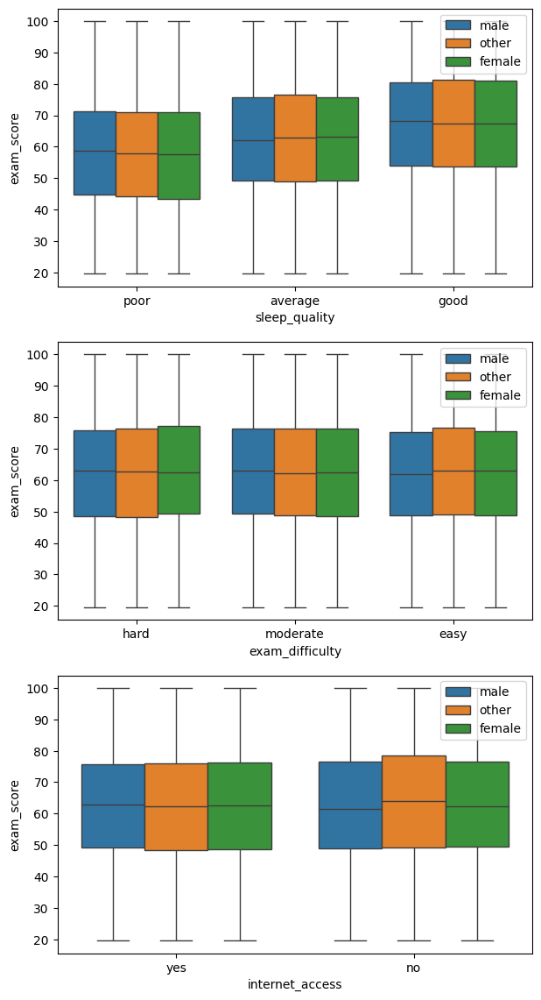

In [91]:
fig, axes = plt.subplots(nrows=3, figsize=(7, 14))

ax = sns.boxplot(data=df_raw, x="sleep_quality", y="exam_score", hue="gender", ax=axes[0])
ax.legend(loc="upper right")

ax = sns.boxplot(data=df_raw, x="exam_difficulty", y="exam_score", hue="gender", ax=axes[1])
ax.legend(loc="upper right")

ax = sns.boxplot(data=df_raw, x="internet_access", y="exam_score", hue="gender", ax=axes[2])
ax.legend(loc="upper right")

#### Histogram

Text(0.5, 1.0, 'Exam scores for each gender by the count')

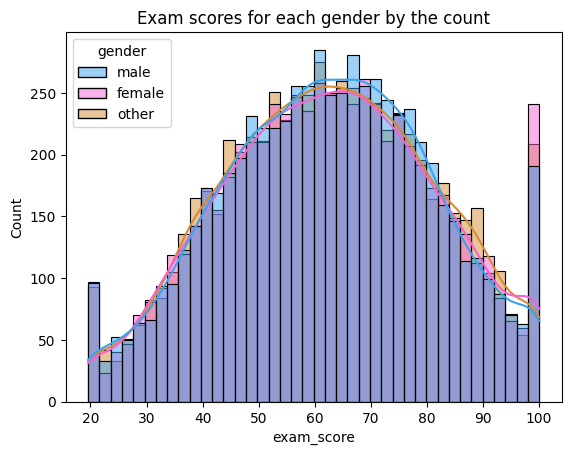

In [147]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

sns.histplot(data=df_raw, x="exam_score", hue="gender", palette=[male, female, other], kde=True, hue_order=["male", "female", "other"],)
plt.title("Exam scores for each gender by the count")

Text(0.5, 1.0, 'Exam scores for each gender by the count')

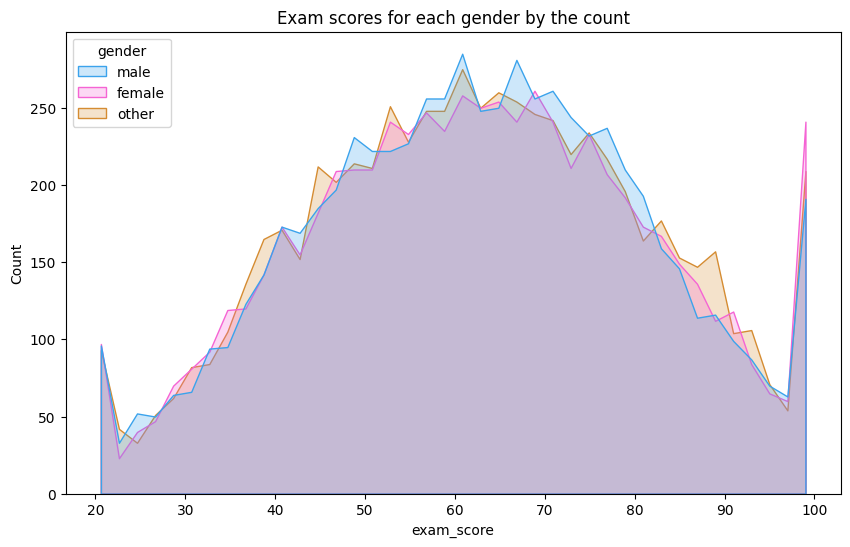

In [150]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, x="exam_score", hue="gender", palette=[male, female, other], hue_order=["male", "female", "other"], element="poly")
plt.title("Exam scores for each gender by the count")

Text(0.5, 1.0, 'Exam scores for each gender by the count')

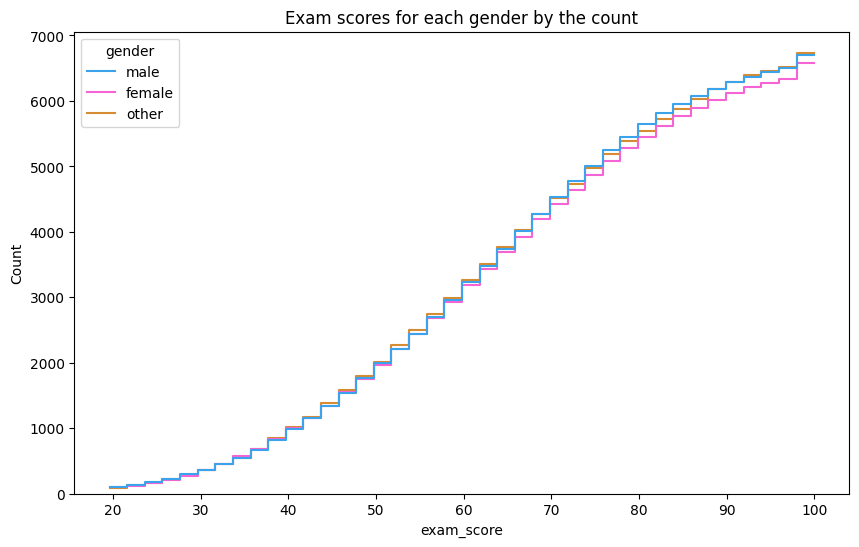

In [160]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, 
             x="exam_score", 
             hue="gender", 
             palette=[male, female, other], 
             hue_order=["male", "female", "other"], 
             element="step", 
             common_norm=False, 
             cumulative=True, 
             fill=False,)
plt.title("Exam scores for each gender by the count")



<Axes: xlabel='internet_access', ylabel='Count'>

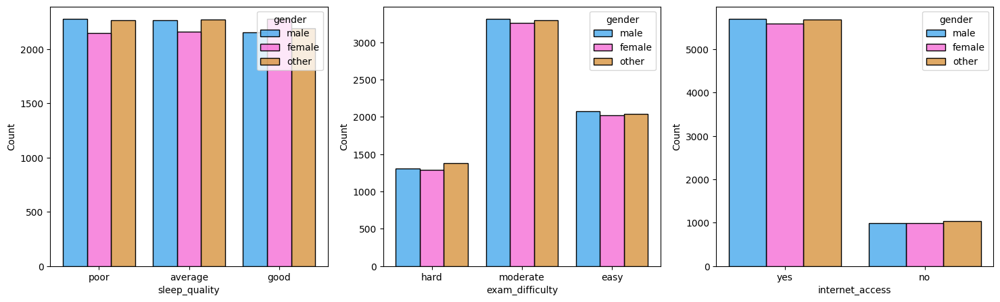

In [173]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

sns.histplot(data=df_raw, 
             x="sleep_quality",
             hue="gender", 
             multiple="dodge",
             shrink=.8,
             palette=[male, female, other], 
             hue_order=["male", "female", "other"], 
             ax=axes[0])


sns.histplot(data=df_raw, 
             x="exam_difficulty",
             hue="gender", 
             multiple="dodge",
             shrink=.8,
             palette=[male, female, other], 
             hue_order=["male", "female", "other"], 
             ax=axes[1])


sns.histplot(data=df_raw, 
             x="internet_access",
             hue="gender", 
             multiple="dodge",
             shrink=.8,
             palette=[male, female, other], 
             hue_order=["male", "female", "other"], 
             ax=axes[2])

Text(0.5, 1.0, 'By genders')

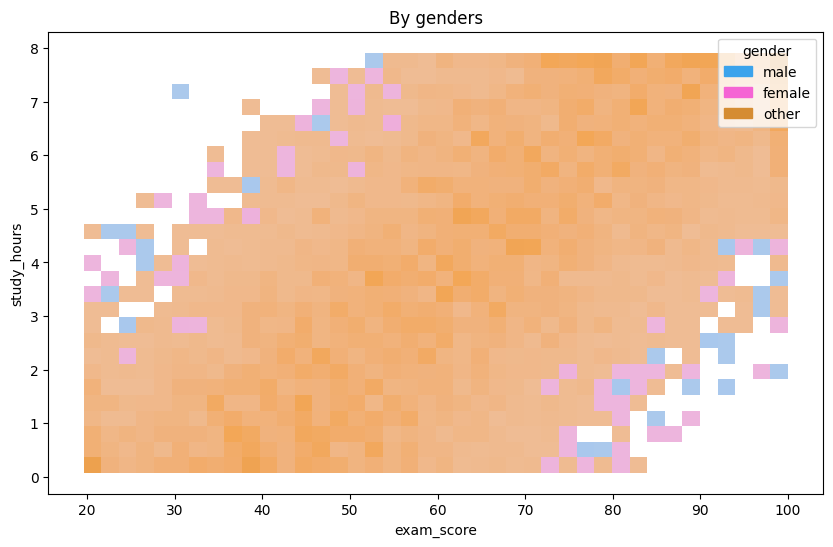

In [178]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, 
             x="exam_score", 
             y="study_hours", 
             hue="gender",
             palette=[male, female, other], 
             hue_order=["male", "female", "other"],  
            )
plt.title("By genders")

<Axes: xlabel='exam_score', ylabel='study_hours'>

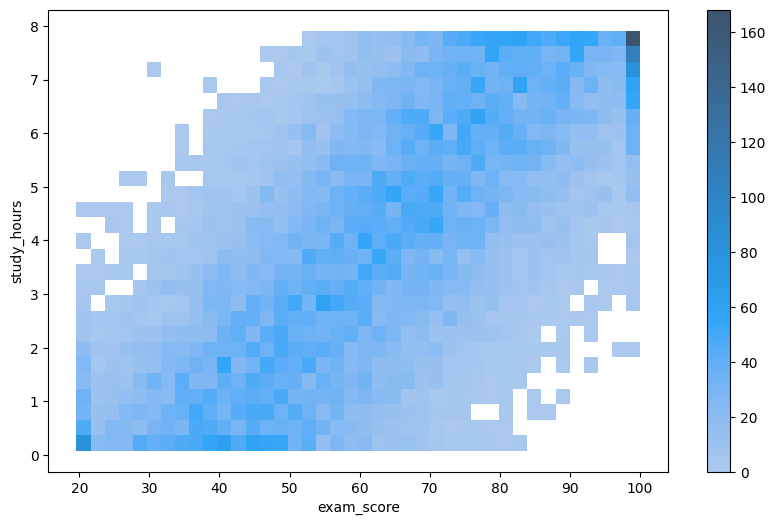

In [184]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, 
             x="exam_score", 
             y="study_hours", 
             cbar=True)

<Axes: xlabel='exam_score', ylabel='age'>

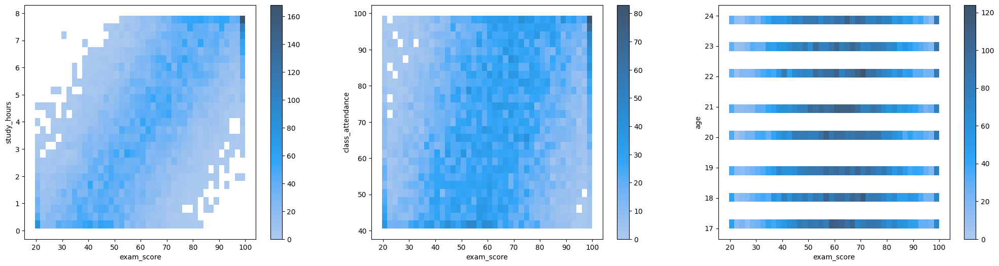

In [207]:
fig, axes = plt.subplots(ncols=3, figsize=(25, 6))

sns.histplot(data=df_raw, 
             x="exam_score", 
             y="study_hours", 
             cbar=True, 
             ax=axes[0])

sns.histplot(data=df_raw, 
             x="exam_score", 
             y="class_attendance", 
             cbar=True, 
             ax=axes[1])

sns.histplot(data=df_raw, 
             x="exam_score", 
             y="age", 
             cbar=True, 
             ax=axes[2])

<Axes: xlabel='exam_score', ylabel='gender'>

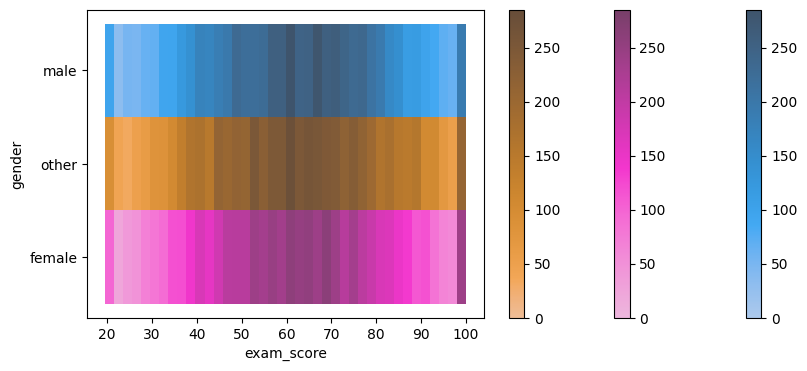

In [242]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

plt.figure(figsize=(10, 4))
sns.histplot(data=df_raw, 
             x="exam_score", 
             y="gender", 
             hue="gender",
             palette=[male, female, other], 
             hue_order=["male", "female", "other"], 
             cbar=True,
             legend=False,
            )

#### Scatterplot

<Axes: xlabel='exam_score', ylabel='study_hours'>

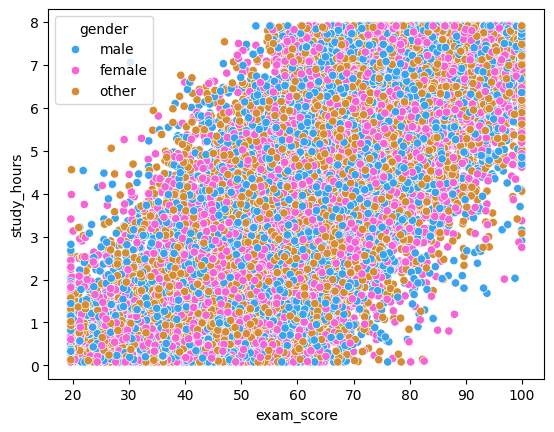

In [256]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]


sns.scatterplot(
    data=df_raw, 
    x="exam_score", 
    y="study_hours", 
    hue="gender",
    hue_order=["male", "female", "other"],
    palette=[male, female, other]
)

<Axes: xlabel='exam_score', ylabel='study_hours'>

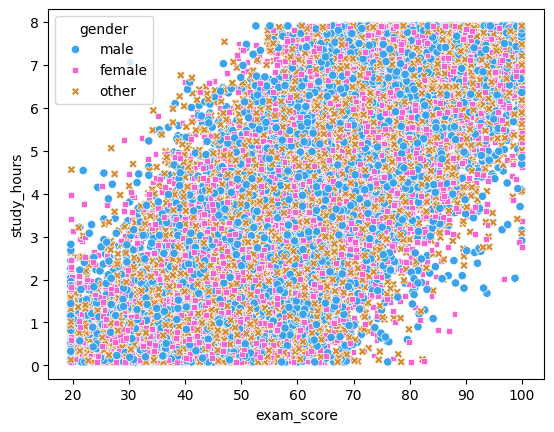

In [276]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]


sns.scatterplot(
    data=df_raw, 
    x="exam_score", 
    y="study_hours", 
    hue="gender",
    hue_order=["male", "female", "other"],
    palette=[male, female, other],
    style="gender",
)

<Axes: xlabel='exam_score', ylabel='study_hours'>

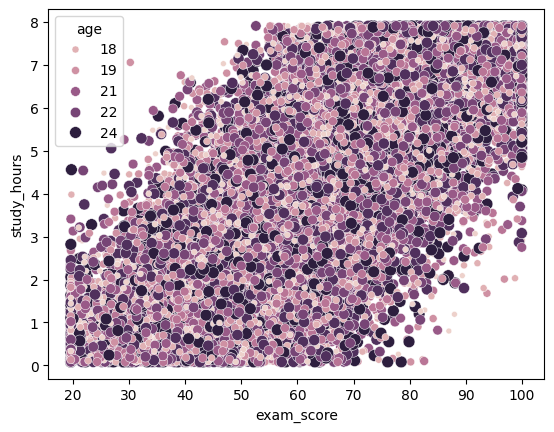

In [286]:
sns.scatterplot(
    data=df_raw, 
    x="exam_score", 
    y="study_hours", 
    hue="age",
    size="age",
)

<Axes: xlabel='exam_score', ylabel='study_hours'>

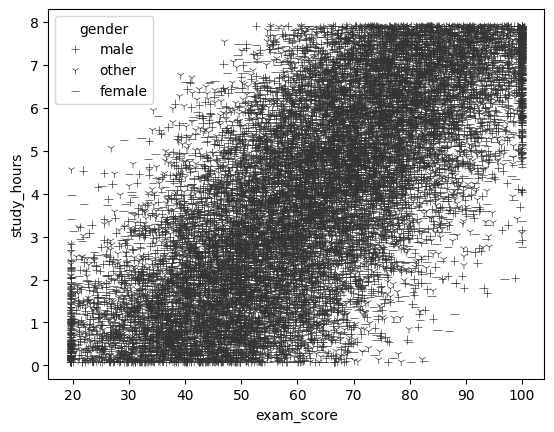

In [295]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

markers = {"male" : "+", "female" : "_", "other" : "1"}
sns.scatterplot(
    data=df_raw, 
    x="exam_score", 
    y="study_hours", 
    style="gender",
    markers = markers,
    color=".2",
)

wtf?

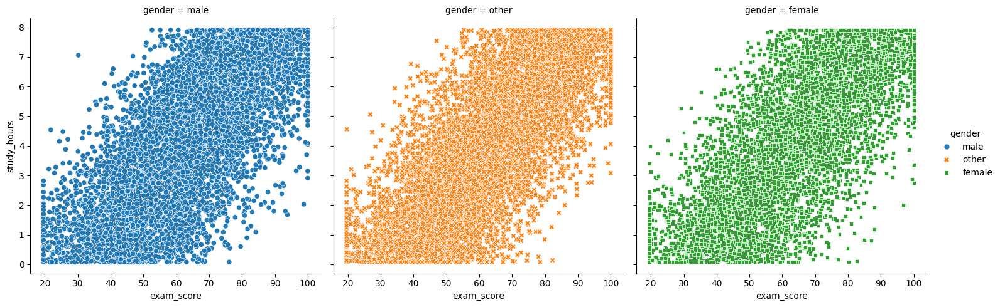

In [300]:
sns.relplot(
    data=df_raw,
    x="exam_score",
    y="study_hours",
    col="gender",
    hue="gender",
    style="gender",
    kind="scatter",
)

Still wtf, but, maybe usefull. Actually, this is the most useless shit ever honestly specifically with this large amounf of data

Text(0.5, 1.0, 'Exam scores by internet accessability and study hours')

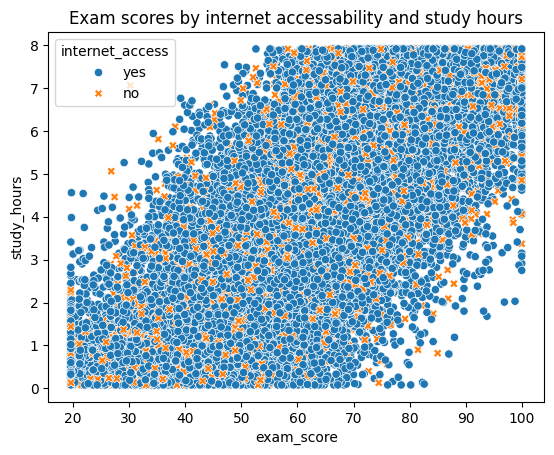

In [302]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]


sns.scatterplot(
    data=df_raw, 
    x="exam_score", 
    y="study_hours", 
    hue="internet_access",
    style="internet_access",
)
plt.title("Exam scores by internet accessability and study hours")

P/S: That person with less than 4 hours of studying and no internet access, hitting the absolute 100 in the exam, goated, please clap!

That's all, I couldn't get much more visual data from this, you can only learn about its median because it's obvious, maybe my knowledge is still bad at it but hey, at least I did it!

I came down to the conclusion that I personally do not fw scatterplot for more than 3 dimensional data, because it's useless

#### Barplot

<Axes: xlabel='age', ylabel='sleep_hours'>

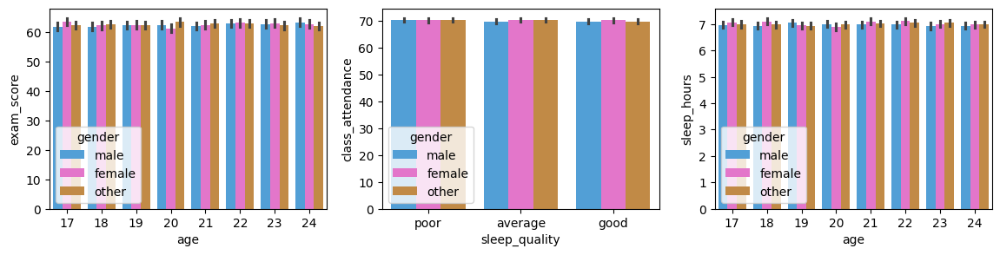

In [340]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

fig, axes = plt.subplots(ncols=3, figsize=(14, 3))
sns.barplot(
    data=df_raw,
    x="age", 
    y="exam_score", 
    hue="gender", 
#    estimator = "sum",
    hue_order = ["male", "female", "other"],
    palette=[male, female, other],
    ax=axes[0],
)

sns.barplot(
    data=df_raw,
    x="sleep_quality", 
    y="class_attendance", 
    hue="gender",  
#    estimator = "sum",
    hue_order = ["male", "female", "other"],
    palette=[male, female, other],
    ax=axes[1],
)

sns.barplot(
    data=df_raw,
    x="age", 
    y="sleep_hours", 
    hue="gender",  
#    estimator = "sum",
    hue_order = ["male", "female", "other"],
    palette=[male, female, other],
    ax=axes[2],
)

Pretty useless with this dataset again? ahh, I will use them in another dataset 

#### KDE

<Axes: xlabel='exam_score', ylabel='Density'>

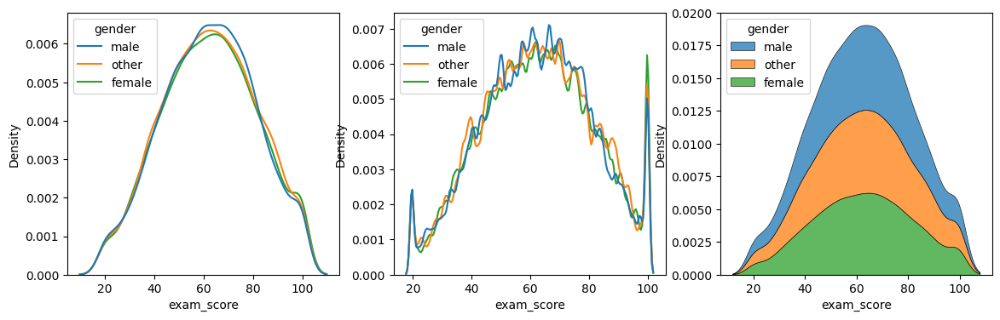

In [416]:
fig, axes = plt.subplots(ncols=3, figsize=(14, 4))


sns.kdeplot(
    data=df_raw, 
    x = "exam_score",
    hue = "gender",
    ax = axes[0]
)

sns.kdeplot(
    data=df_raw, 
    x = "exam_score",
    hue = "gender",
    bw_adjust=.2,
    ax = axes[1]
)

sns.kdeplot(
    data=df_raw, 
    x = "exam_score",
    hue = "gender",
    multiple = "stack",
    ax = axes[2],
    linewidth = .4,
)

<Axes: xlabel='exam_score', ylabel='Density'>

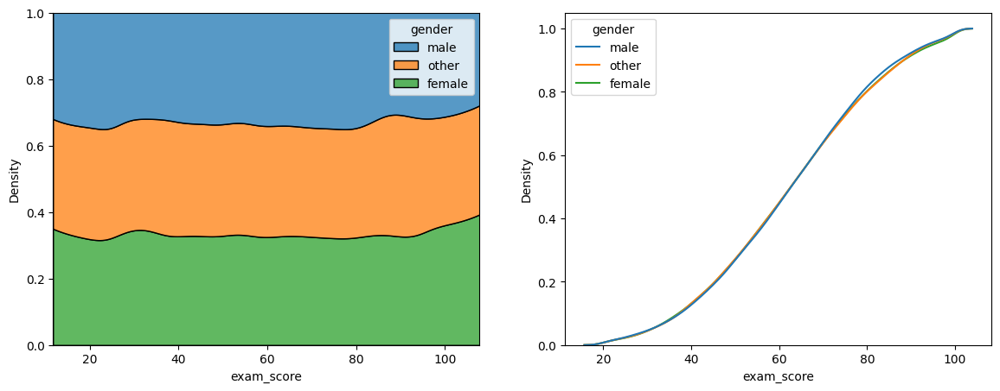

In [417]:
fig, axes = plt.subplots(ncols=2, figsize=(14, 5))

sns.kdeplot(
    data=df_raw, 
    x = "exam_score",
    hue = "gender",
    multiple = "fill",
    ax = axes[0],
)

sns.kdeplot(
    data=df_raw, x="exam_score", hue="gender",
    cumulative=True, common_norm=False, common_grid=True, bw_adjust=.5, ax = axes[1]
)

<Axes: xlabel='exam_score', ylabel='Density'>

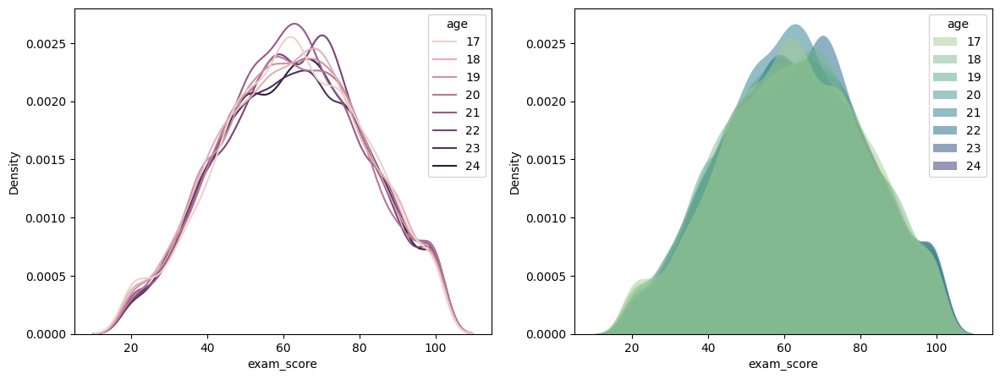

In [418]:
fig, axes = plt.subplots(ncols=2, figsize=(14, 5))

sns.kdeplot(
    data=df_raw, 
    x = "exam_score",
    hue = "age",
    bw_adjust = 0.8,
    ax = axes[0]
)

sns.kdeplot(
    data = df_raw,
    x = "exam_score",
    hue = "age",
    bw_adjust=.8,
    alpha = .5,
    linewidth = 0,
    fill = True,
    palette = "crest",
    ax = axes[1]
)

<Axes: xlabel='exam_score', ylabel='study_hours'>

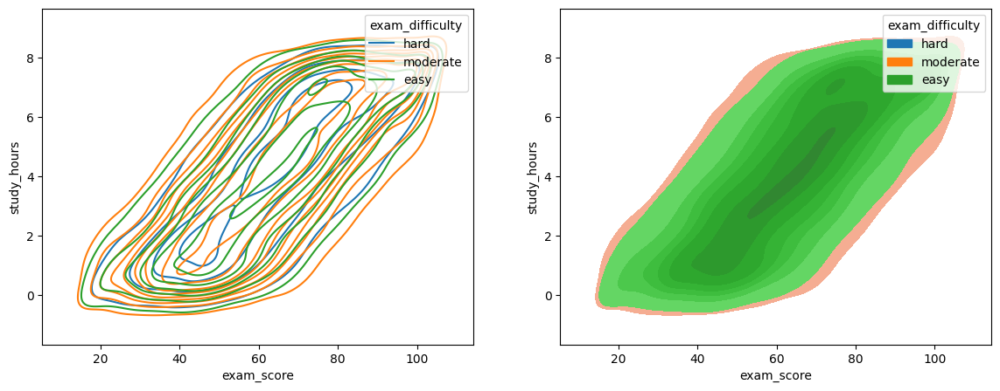

In [419]:
fig, axes = plt.subplots(ncols=2, figsize=(14, 5))

sns.kdeplot(
    data = df_raw,
    x = "exam_score",
    y = "study_hours",
    hue = "exam_difficulty",
    ax =axes[0],
)

sns.kdeplot(
    data = df_raw,
    x = "exam_score",
    y = "study_hours",
    hue = "exam_difficulty",
    fill = True,
    ax = axes[1],
)

<Axes: xlabel='exam_score', ylabel='study_hours'>

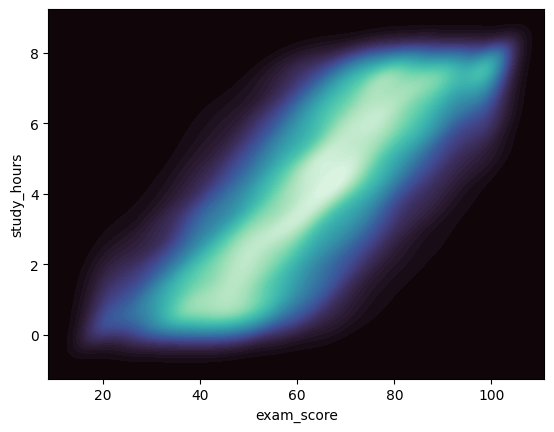

In [420]:
sns.kdeplot(
    data = df_raw,
    x = "exam_score",
    y = "study_hours",
    fill = True,
    thresh = 0,
    levels = 100,
    cmap = "mako",
)

#### Pairplot

In [425]:
male = sns.color_palette("husl", 9)[6]
female = sns.color_palette("husl", 9)[8]
other = sns.color_palette("husl", 9)[1]

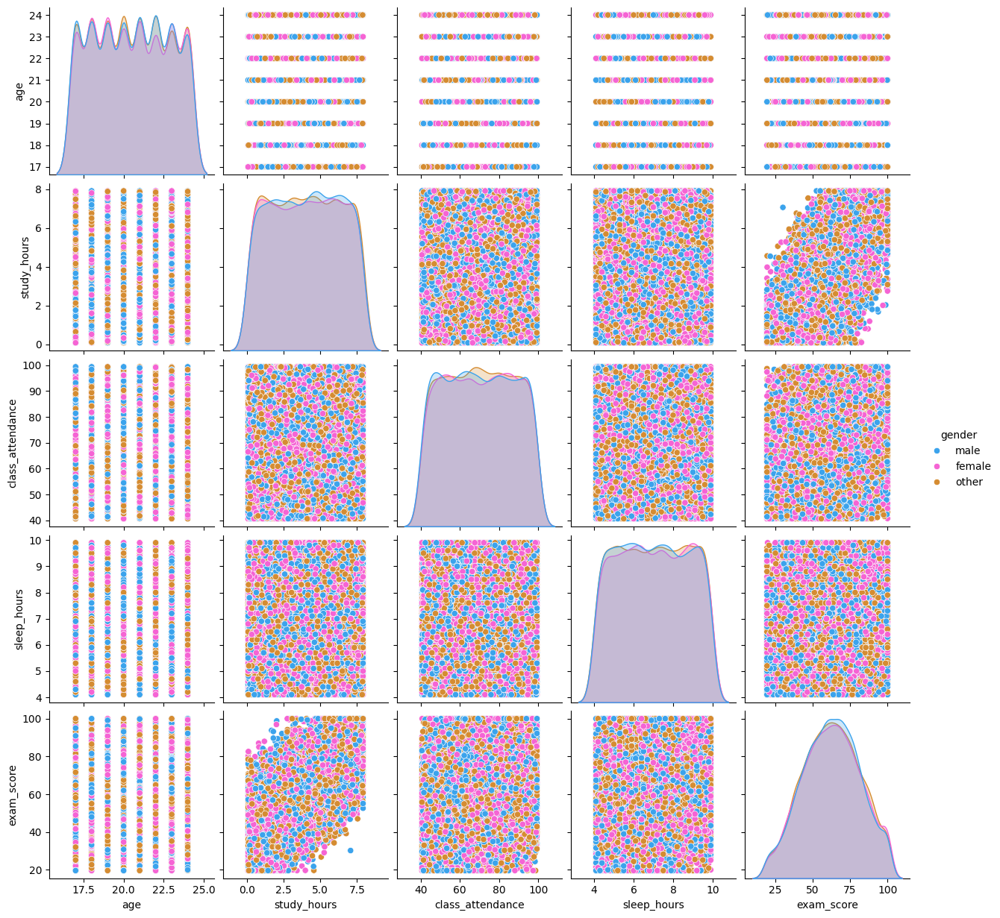

In [426]:
sns.pairplot(
    data = df_raw,
    hue = "gender",
    hue_order = ["male", "female", "other"],
    palette = [male, female, other],
)

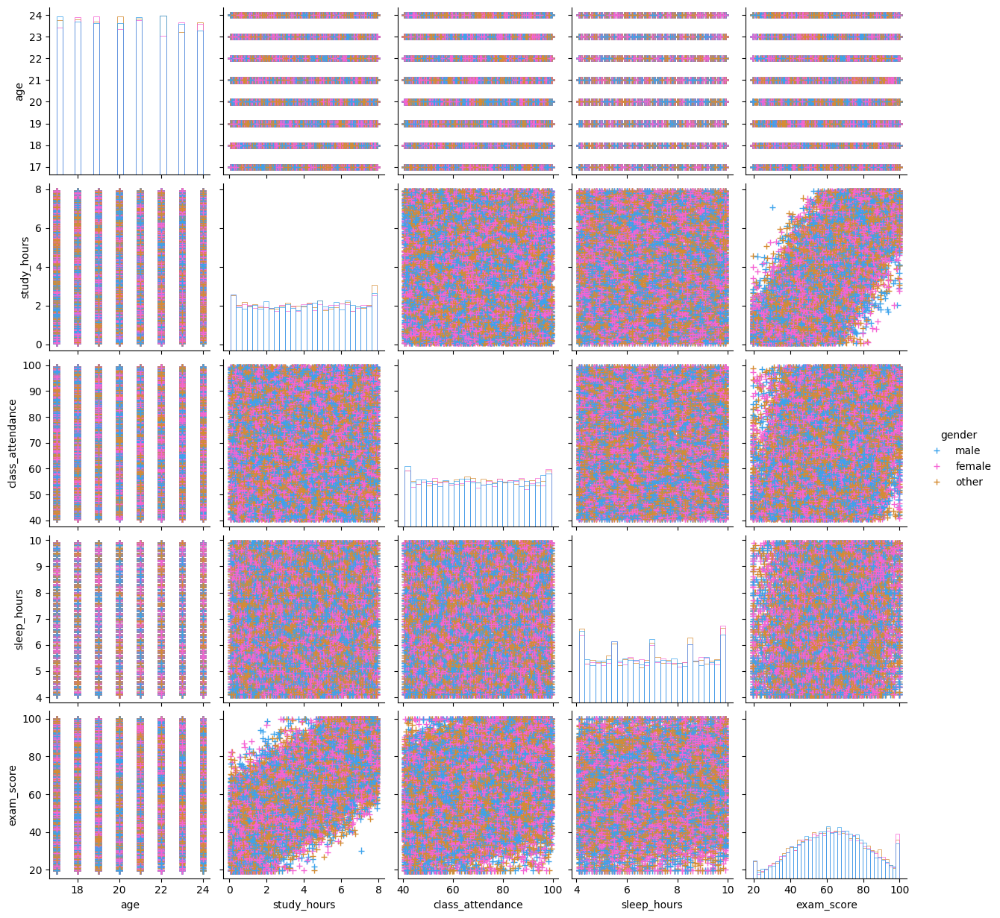

In [431]:
sns.pairplot(
    data = df_raw,
    hue = "gender",
    hue_order = ["male", "female", "other"],
    palette = [male, female, other],
    diag_kind = "hist",
    plot_kws = dict(marker="+", linewidth=1,),
    diag_kws = dict(fill=False),
)

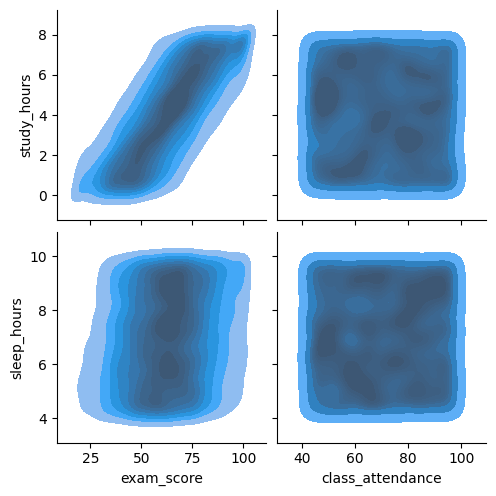

In [450]:
sns.pairplot(
    data = df_raw,
    x_vars = ["exam_score", "class_attendance",],
    y_vars = ["study_hours", "sleep_hours",],
    kind = "kde",
    plot_kws = dict(fill=True)
)

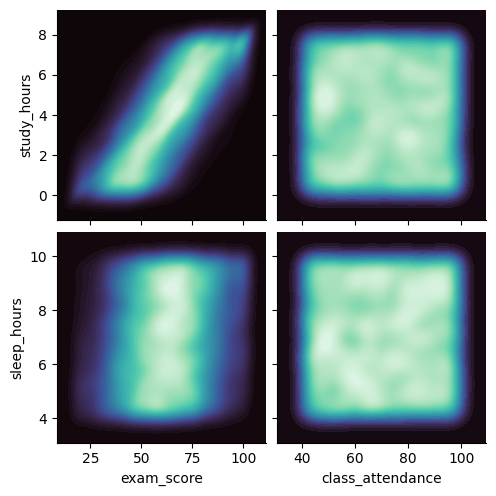

In [451]:
sns.pairplot(
    data = df_raw,
    x_vars = ["exam_score", "class_attendance",],
    y_vars = ["study_hours", "sleep_hours",],
    kind = "kde",
    plot_kws = dict(fill=True, cmap="mako", thresh=0, levels=120)
)

#### Jointplot

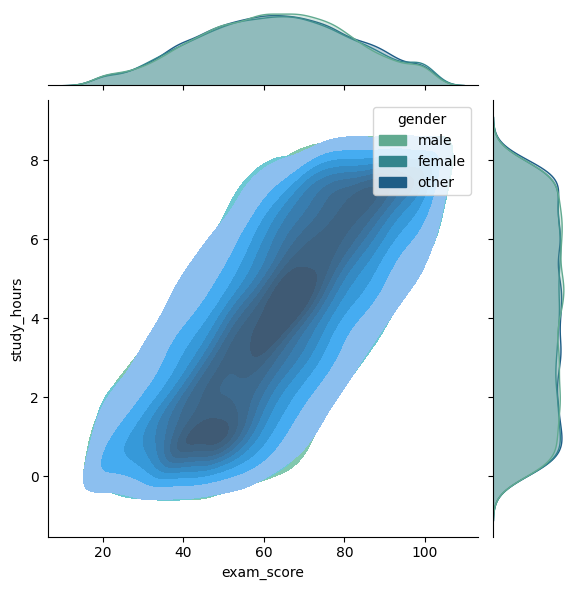

In [459]:
sns.jointplot(
    data = df_raw,
    x = "exam_score",
    y = "study_hours",
    hue = "gender",
    kind = "kde",
    hue_order = ["male", "female", "other"],
#    palette = [male, female, other],
    palette = "crest",
    fill = True,
)

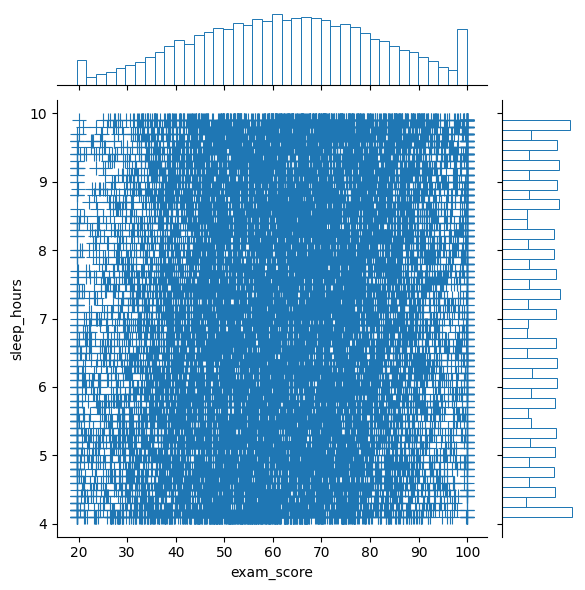

In [462]:
sns.jointplot(
    data = df_raw,
    x = "exam_score",
    y = "sleep_hours",
    marker = "+",
    s = 100,
    marginal_kws = dict(bins=40, fill=False),
)

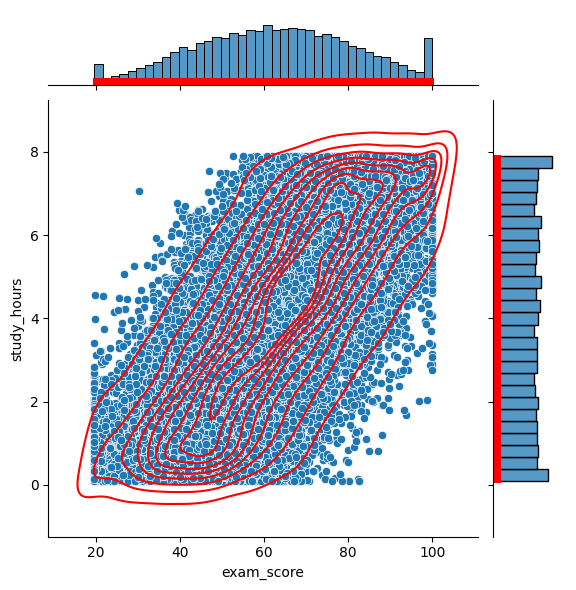

In [478]:
g = sns.jointplot(
    data = df_raw, 
    x = "exam_score",
    y = "study_hours",
)
g.plot_joint(sns.kdeplot, color="r", levels=10)
g.plot_marginals(sns.rugplot, color="r", height=.1, clip_on=False)

#### Counterplot

<Axes: xlabel='gender', ylabel='count'>

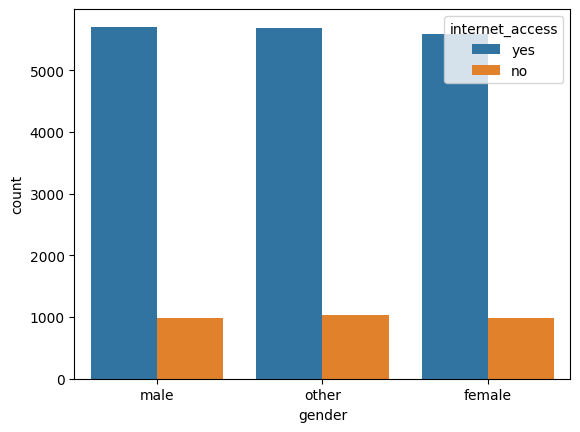

In [485]:
sns.countplot(
    data = df_raw,
    x = "gender",
    hue = "internet_access",
#    stat = "percent",
)

Dude, it just counts, yea, that's all, simlpe, just counts, sum, cool, easy, simple. If you wanna count anything just use countplot, it counts it for you so you don't have to

#### Pie

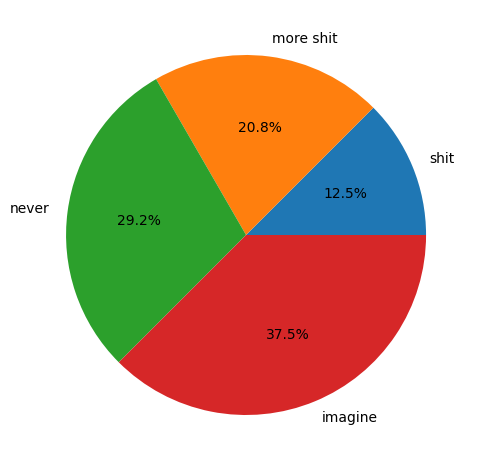

In [489]:
fig, ax = plt.subplots()
ax.pie(
    [3, 5, 7, 9], 
    labels = ["shit", "more shit", "never", "imagine"],
    autopct='%1.1f%%',
)
plt.tight_layout()
plt.show()

Alright, my final verdict, pie is bullshit if you don't know how to use it, sush as me.

# Data Processing / train test

#### train_test_split

In [163]:
target = "exam_score"
features = ["study_hours", "class_attendance", "sleep_hours", "sleep_quality"]

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y)

# Models

#### A function for saving the results for comparing later

In [164]:
scores = pd.DataFrame(columns=["model", "method", "score"])

def saveit(model: str, method: str, score: float):
    scores.loc[len(scores)] = [model, method, score]

### Linear Regression

#### Basic

In [165]:
lr = LinearRegression(
    fit_intercept=True, 
    copy_X=True, 
    tol=1e-06, 
    n_jobs=None, 
    positive=False
)

In [166]:
lr.fit(X_train, y_train)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [167]:
X_train

,study_hours,class_attendance,sleep_hours,sleep_quality
11862,4.09,66.4,8.7,2
11050,6.09,43.0,5.6,0
9668,3.44,70.7,9.2,1
18014,6.42,66.7,8.0,0
16225,3.19,61.9,6.4,2
...,...,...,...,...
15949,2.67,43.5,4.8,2
16065,2.27,75.4,5.9,0
12053,5.91,64.0,9.2,1
7159,7.25,62.3,5.4,1


In [168]:
sc = lr.score(X_test, y_test)

In [169]:
sc

0.6714866395808641

In [170]:
saveit("LinearRegression", "traditional/train_test_split", sc)

In [171]:
sc

0.6714866395808641

In [172]:
scores

,model,method,score
0,LinearRegression,traditional/train_test_split,0.671487


In [173]:
lr_pred = lr.predict(X_test)

Text(0.5, 1.0, 'Red is predicted, Black is the actual data')

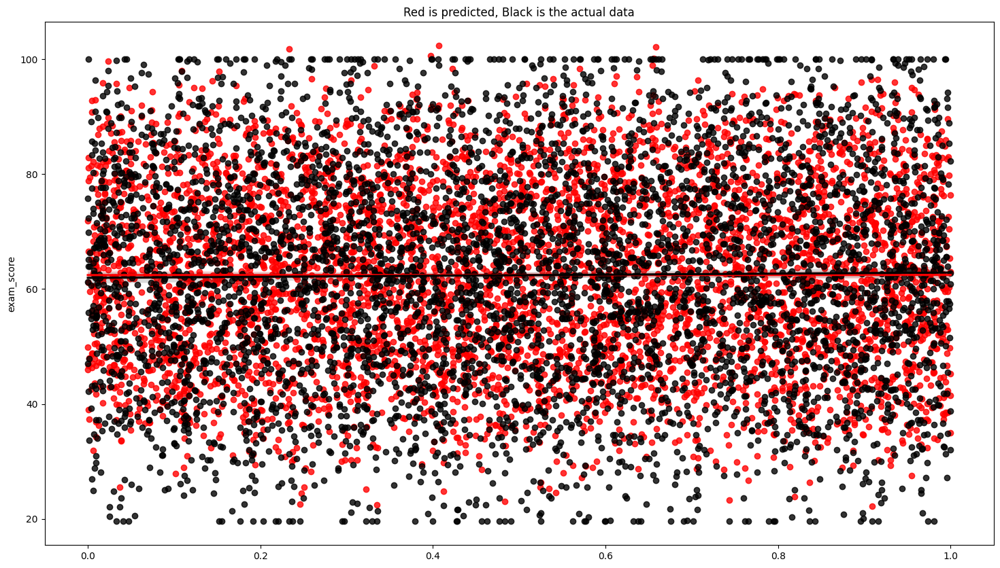

In [174]:
plt.figure(figsize=(18, 10))

ran = np.random.random(5000)

sns.regplot(x=ran, y=lr_pred, color='r')
sns.regplot(x=ran, y=y_test, color='k')

plt.title("Red is predicted, Black is the actual data")

<Axes: ylabel='exam_score'>

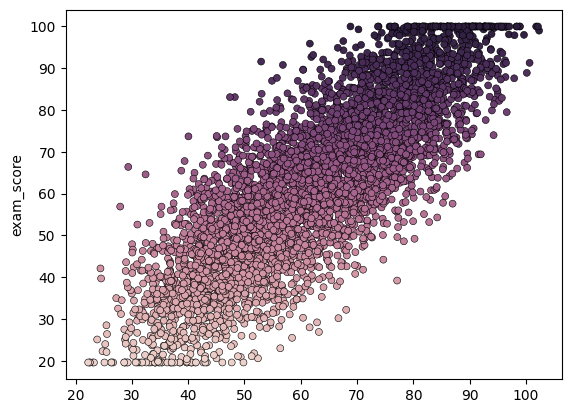

In [179]:
sns.scatterplot(x=lr_pred, y=y_test, hue=y_test, marker="o", s=25, edgecolor="k", legend=False)

#### PolynomialFeatures

In [180]:
poly = PolynomialFeatures(degree=2)

In [181]:
ployx = poly.fit_transform(X_train)

In [182]:
ployxt = poly.fit_transform(X_test)

In [183]:
lr.fit(ployx, y_train)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [184]:
plsc = lr.score(ployxt, y_test)

In [185]:
saveit("LinearRegression", "PolynomialFeatures", plsc)

#### PolynomialFeatures Pipeline

In [186]:
poly_lr = make_pipeline(PolynomialFeatures(degree=5), LinearRegression())

In [187]:
poly_lr.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('polynomialfeatures', ...), ('linearregression', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"degree degree: int or tuple (min_degree, max_degree), default=2If a single int is given, it specifies the maximal degree of thepolynomial features. If a tuple `(min_degree, max_degree)` is passed,then `min_degree` is the minimum and `max_degree` is the maximumpolynomial degree of the generated features. Note that `min_degree=0`and `min_degree=1` are equivalent as outputting the degree zero term isdetermined by `include_bias`.",5
,"interaction_only interaction_only: bool, default=FalseIf `True`, only interaction features are produced: features that areproducts of at most `degree` *distinct* input features, i.e. terms withpower of 2 or higher of the same input feature are excluded:- included: `x[0]`, `x[1]`, `x[0] * x[1]`, etc.- excluded: `x[0] ** 2`, `x[0] ** 2 * x[1]`, etc.",False
,"include_bias include_bias: bool, default=TrueIf `True` (default), then include a bias column, the feature in whichall polynomial powers are zero (i.e. a column of ones - acts as anintercept term in a linear model).",True
,"order order: {'C', 'F'}, default='C'Order of output array in the dense case. `'F'` order is faster tocompute, but may slow down subsequent estimators... versionadded:: 0.21",'C'
,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06


In [188]:
pipsc = poly_lr.score(X_test, y_test)

In [189]:
saveit("LinearRegression", "Poly Pipeline", pipsc)

In [190]:
scores

,model,method,score
0,LinearRegression,traditional/train_test_split,0.671487
1,LinearRegression,PolynomialFeatures,0.671138
2,LinearRegression,Poly Pipeline,0.669969


### Ridge

#### Not Scaled

In [191]:
clf = Ridge(alpha=1.0)

clf.fit(X_train, y_train)

,"alpha alpha: {float, ndarray of shape (n_targets,)}, default=1.0Constant that multiplies the L2 term, controlling regularizationstrength. `alpha` must be a non-negative float i.e. in `[0, inf)`.When `alpha = 0`, the objective is equivalent to ordinary leastsquares, solved by the :class:`LinearRegression` object. For numericalreasons, using `alpha = 0` with the `Ridge` object is not advised.Instead, you should use the :class:`LinearRegression` object.If an array is passed, penalties are assumed to be specific to thetargets. Hence they must correspond in number.",1.0
,"fit_intercept fit_intercept: bool, default=TrueWhether to fit the intercept for this model. If setto false, no intercept will be used in calculations(i.e. ``X`` and ``y`` are expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"max_iter max_iter: int, default=NoneMaximum number of iterations for conjugate gradient solver.For 'sparse_cg' and 'lsqr' solvers, the default value is determinedby scipy.sparse.linalg. For 'sag' solver, the default value is 1000.For 'lbfgs' solver, the default value is 15000.",None
,"tol tol: float, default=1e-4The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for each solver:- 'svd': `tol` has no impact.- 'cholesky': `tol` has no impact.- 'sparse_cg': norm of residuals smaller than `tol`.- 'lsqr': `tol` is set as atol and btol of scipy.sparse.linalg.lsqr, which control the norm of the residual vector in terms of the norms of matrix and coefficients.- 'sag' and 'saga': relative change of coef smaller than `tol`.- 'lbfgs': maximum of the absolute (projected) gradient=max|residuals| smaller than `tol`... versionchanged:: 1.2 Default value changed from 1e-3 to 1e-4 for consistency with other linear models.",0.0001
,"solver solver: {'auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs'}, default='auto'Solver to use in the computational routines:- 'auto' chooses the solver automatically based on the type of data.- 'svd' uses a Singular Value Decomposition of X to compute the Ridge coefficients. It is the most stable solver, in particular more stable for singular matrices than 'cholesky' at the cost of being slower.- 'cholesky' uses the standard :func:`scipy.linalg.solve` function to obtain a closed-form solution.- 'sparse_cg' uses the conjugate gradient solver as found in :func:`scipy.sparse.linalg.cg`. As an iterative algorithm, this solver is more appropriate than 'cholesky' for large-scale data (possibility to set `tol` and `max_iter`).- 'lsqr' uses the dedicated regularized least-squares routine :func:`scipy.sparse.linalg.lsqr`. It is the fastest and uses an iterative procedure.- 'sag' uses a Stochastic Average Gradient descent, and 'saga' uses its improved, unbiased version named SAGA. Both methods also use an iterative procedure, and are often faster than other solvers when both n_samples and n_features are large. Note that 'sag' and 'saga' fast convergence is only guaranteed on features with approximately the same scale. You can preprocess the data with a scaler from :mod:`sklearn.preprocessing`.- 'lbfgs' uses L-BFGS-B algorithm implemented in :func:`scipy.optimize.minimize`. It can be used only when `positive` is True.All solvers except 'svd' support both dense and sparse data. However, only'lsqr', 'sag', 'sparse_cg', and 'lbfgs' support sparse input when`fit_intercept` is True... versionadded:: 0.17 Stochastic Average Gradient descent solver... versionadded:: 0.19 SAGA solver.",'auto'
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive.Only 'lbfgs' solver is supported in this case.",False
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag' or 'saga' to shuffle the data.See :term:`Glossary ` for details... versionadded:: 0.17 `random_state` to support Stochastic Average Gradient.",None


In [192]:
clf.score(X_test, y_test)

0.6714867443643074

#### Scaled (StandardScaler)

In [193]:
scaler = StandardScaler()

In [194]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [195]:
rg = Ridge(alpha=1.0)
rg.fit(X_train_scaled, y_train)

,"alpha alpha: {float, ndarray of shape (n_targets,)}, default=1.0Constant that multiplies the L2 term, controlling regularizationstrength. `alpha` must be a non-negative float i.e. in `[0, inf)`.When `alpha = 0`, the objective is equivalent to ordinary leastsquares, solved by the :class:`LinearRegression` object. For numericalreasons, using `alpha = 0` with the `Ridge` object is not advised.Instead, you should use the :class:`LinearRegression` object.If an array is passed, penalties are assumed to be specific to thetargets. Hence they must correspond in number.",1.0
,"fit_intercept fit_intercept: bool, default=TrueWhether to fit the intercept for this model. If setto false, no intercept will be used in calculations(i.e. ``X`` and ``y`` are expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"max_iter max_iter: int, default=NoneMaximum number of iterations for conjugate gradient solver.For 'sparse_cg' and 'lsqr' solvers, the default value is determinedby scipy.sparse.linalg. For 'sag' solver, the default value is 1000.For 'lbfgs' solver, the default value is 15000.",None
,"tol tol: float, default=1e-4The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for each solver:- 'svd': `tol` has no impact.- 'cholesky': `tol` has no impact.- 'sparse_cg': norm of residuals smaller than `tol`.- 'lsqr': `tol` is set as atol and btol of scipy.sparse.linalg.lsqr, which control the norm of the residual vector in terms of the norms of matrix and coefficients.- 'sag' and 'saga': relative change of coef smaller than `tol`.- 'lbfgs': maximum of the absolute (projected) gradient=max|residuals| smaller than `tol`... versionchanged:: 1.2 Default value changed from 1e-3 to 1e-4 for consistency with other linear models.",0.0001
,"solver solver: {'auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs'}, default='auto'Solver to use in the computational routines:- 'auto' chooses the solver automatically based on the type of data.- 'svd' uses a Singular Value Decomposition of X to compute the Ridge coefficients. It is the most stable solver, in particular more stable for singular matrices than 'cholesky' at the cost of being slower.- 'cholesky' uses the standard :func:`scipy.linalg.solve` function to obtain a closed-form solution.- 'sparse_cg' uses the conjugate gradient solver as found in :func:`scipy.sparse.linalg.cg`. As an iterative algorithm, this solver is more appropriate than 'cholesky' for large-scale data (possibility to set `tol` and `max_iter`).- 'lsqr' uses the dedicated regularized least-squares routine :func:`scipy.sparse.linalg.lsqr`. It is the fastest and uses an iterative procedure.- 'sag' uses a Stochastic Average Gradient descent, and 'saga' uses its improved, unbiased version named SAGA. Both methods also use an iterative procedure, and are often faster than other solvers when both n_samples and n_features are large. Note that 'sag' and 'saga' fast convergence is only guaranteed on features with approximately the same scale. You can preprocess the data with a scaler from :mod:`sklearn.preprocessing`.- 'lbfgs' uses L-BFGS-B algorithm implemented in :func:`scipy.optimize.minimize`. It can be used only when `positive` is True.All solvers except 'svd' support both dense and sparse data. However, only'lsqr', 'sag', 'sparse_cg', and 'lbfgs' support sparse input when`fit_intercept` is True... versionadded:: 0.17 Stochastic Average Gradient descent solver... versionadded:: 0.19 SAGA solver.",'auto'
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive.Only 'lbfgs' solver is supported in this case.",False
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag' or 'saga' to shuffle the data.See :term:`Glossary ` for details... versionadded:: 0.17 `random_state` to support Stochastic Average Gradient.",None


In [196]:
rg.score(X_test_scaled, y_test)

0.6714862430045309

### Lasso

In [197]:
ls = Lasso(alpha=0.1)
ls.fit(X_train_scaled, y_train)

,"alpha alpha: float, default=1.0Constant that multiplies the L1 term, controlling regularizationstrength. `alpha` must be a non-negative float i.e. in `[0, inf)`.When `alpha = 0`, the objective is equivalent to ordinary leastsquares, solved by the :class:`LinearRegression` object. For numericalreasons, using `alpha = 0` with the `Lasso` object is not advised.Instead, you should use the :class:`LinearRegression` object.",0.1
,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"precompute precompute: bool or array-like of shape (n_features, n_features), default=FalseWhether to use a precomputed Gram matrix to speed upcalculations. The Gram matrix can also be passed as argument.For sparse input this option is always ``False`` to preserve sparsity.",False
,"copy_X copy_X: bool, default=TrueIf ``True``, X will be copied; else, it may be overwritten.",True
,"max_iter max_iter: int, default=1000The maximum number of iterations.",1000
,"tol tol: float, default=1e-4The tolerance for the optimization: if the updates are smaller or equal to``tol``, the optimization code checks the dual gap for optimality and continuesuntil it is smaller or equal to ``tol``, see Notes below.",0.0001
,"warm_start warm_start: bool, default=FalseWhen set to ``True``, reuse the solution of the previous call to fit asinitialization, otherwise, just erase the previous solution.See :term:`the Glossary `.",False
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive.",False
,"random_state random_state: int, RandomState instance, default=NoneThe seed of the pseudo random number generator that selects a randomfeature to update. Used when ``selection`` == 'random'.Pass an int for reproducible output across multiple function calls.See :term:`Glossary `.",None
,"selection selection: {'cyclic', 'random'}, default='cyclic'If set to 'random', a random coefficient is updated every iterationrather than looping over features sequentially by default. This(setting to 'random') often leads to significantly faster convergenceespecially when tol is higher than 1e-4.",'cyclic'


In [198]:
ls.score(X_test_scaled, y_test)

0.671499016196714

### RandomForestRegressor

In [199]:
rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=4,
    bootstrap=True,
    max_features=1.0,
)

In [200]:
rf.fit(X_train, y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",200
,"criterion criterion: {""squared_error"", ""absolute_error"", ""friedman_mse"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in Poisson deviance to find splits.Training using ""absolute_error"" is significantly slowerthan when using ""squared_error""... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 1.0 Poisson criterion.",'squared_error'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",4
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=1.0The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None or 1.0, then `max_features=n_features`... note:: The default of 1.0 is equivalent to bagged trees and more randomness can be achieved by setting smaller values, e.g. 0.3... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to 1.0.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",1.0
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples a

In [201]:
rf.score(X_test, y_test)

0.6186125584766667

## Classification

### Classify

In [202]:
df.head(5)

,age,gender,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,exam_difficulty,exam_score
0,17,0,2.78,92.9,1,7.4,0,2,58.9
1,23,1,3.37,64.8,1,4.6,1,1,54.8
2,22,0,7.88,76.8,1,8.5,0,1,90.3
3,20,1,0.67,48.4,1,5.8,1,1,29.7
4,20,2,0.89,71.6,1,9.8,0,1,43.7


In [203]:
df_raw.head(5)

,age,gender,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,exam_difficulty,exam_score
0,17,male,2.78,92.9,yes,7.4,poor,hard,58.9
1,23,other,3.37,64.8,yes,4.6,average,moderate,54.8
2,22,male,7.88,76.8,yes,8.5,poor,moderate,90.3
3,20,other,0.67,48.4,yes,5.8,average,moderate,29.7
4,20,female,0.89,71.6,yes,9.8,poor,moderate,43.7


In [204]:
df['pass'] = df['exam_score'].apply(lambda x : "pass" if x >= 60 else "fail")

In [205]:
df['pass'] = np.where(df['exam_score'] >= 60, "pass", "fail")

both work but isn't it amazing)

In [206]:
df.head(5)

,age,gender,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,exam_difficulty,exam_score,pass
0,17,0,2.78,92.9,1,7.4,0,2,58.9,fail
1,23,1,3.37,64.8,1,4.6,1,1,54.8,fail
2,22,0,7.88,76.8,1,8.5,0,1,90.3,pass
3,20,1,0.67,48.4,1,5.8,1,1,29.7,fail
4,20,2,0.89,71.6,1,9.8,0,1,43.7,fail


#### pre-processing

In [207]:
target = "pass"

y_new = df[target]

In [208]:
X_train, X_test, y_train_new, y_test_new = train_test_split(X, y_new)

### LogisticRegression

In [209]:
logr = LogisticRegression(solver="liblinear", l1_ratio=0.0)
logr.fit(X_train, y_train_new)

,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

In [210]:
pred = logr.predict(X_test)

In [211]:
accuracy_score(y_test_new, pred)

0.8292

### KNeighborsClassifier

In [212]:
kn = KNeighborsClassifier(
    n_neighbors=10, 
    weights="uniform",
    n_jobs=None,
)
kn.fit(X_train, y_train_new)

,"n_neighbors n_neighbors: int, default=5Number of neighbors to use by default for :meth:`kneighbors` queries.",10
,"weights weights: {'uniform', 'distance'}, callable or None, default='uniform'Weight function used in prediction. Possible values:- 'uniform' : uniform weights. All points in each neighborhood are weighted equally.- 'distance' : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.- [callable] : a user-defined function which accepts an array of distances, and returns an array of the same shape containing the weights.Refer to the example entitled:ref:`sphx_glr_auto_examples_neighbors_plot_classification.py`showing the impact of the `weights` parameter on the decisionboundary.",'uniform'
,"algorithm algorithm: {'auto', 'ball_tree', 'kd_tree', 'brute'}, default='auto'Algorithm used to compute the nearest neighbors:- 'ball_tree' will use :class:`BallTree`- 'kd_tree' will use :class:`KDTree`- 'brute' will use a brute-force search.- 'auto' will attempt to decide the most appropriate algorithm based on the values passed to :meth:`fit` method.Note: fitting on sparse input will override the setting ofthis parameter, using brute force.",'auto'
,"leaf_size leaf_size: int, default=30Leaf size passed to BallTree or KDTree. This can affect thespeed of the construction and query, as well as the memoryrequired to store the tree. The optimal value depends on thenature of the problem.",30
,"p p: float, default=2Power parameter for the Minkowski metric. When p = 1, this is equivalentto using manhattan_distance (l1), and euclidean_distance (l2) for p = 2.For arbitrary p, minkowski_distance (l_p) is used. This parameter is expectedto be positive.",2
,"metric metric: str or callable, default='minkowski'Metric to use for distance computation. Default is ""minkowski"", whichresults in the standard Euclidean distance when p = 2. See thedocumentation of `scipy.spatial.distance`_ andthe metrics listed in:class:`~sklearn.metrics.pairwise.distance_metrics` for valid metricvalues.If metric is ""precomputed"", X is assumed to be a distance matrix andmust be square during fit. X may be a :term:`sparse graph`, in whichcase only ""nonzero"" elements may be considered neighbors.If metric is a callable function, it takes two arrays representing 1Dvectors as inputs and must return one value indicating the distancebetween those vectors. This works for Scipy's metrics, but is lessefficient than passing the metric name as a string.",'minkowski'
,"metric_params metric_params: dict, default=NoneAdditional keyword arguments for the metric function.",None
,"n_jobs n_jobs: int, default=NoneThe number of parallel jobs to run for neighbors search.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.Doesn't affect :meth:`fit` method.",None


In [213]:
knpred = kn.predict(X_test)
accuracy_score(y_test_new, knpred)

0.81

## GridSearchCV

### Lasso

In [214]:
alph = range(1, 11)

In [215]:
las = Lasso()

In [216]:
lasso_parameters = {"alpha" : alph}

In [217]:
grid = GridSearchCV(las, lasso_parameters)

In [218]:
grid.fit(X_train, y_train)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Lasso()
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'alpha': range(1, 11)}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",None
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",None
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",None
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold and parameter candidate is displayed;- >2 : the score is also displayed;- >3 : the fold and candidate parameter indexes are also di

In [219]:
sorted(grid.cv_results_.keys())

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_alpha',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

In [220]:
grid.get_params()

{'cv': None,
 'error_score': nan,
 'estimator__alpha': 1.0,
 'estimator__copy_X': True,
 'estimator__fit_intercept': True,
 'estimator__max_iter': 1000,
 'estimator__positive': False,
 'estimator__precompute': False,
 'estimator__random_state': None,
 'estimator__selection': 'cyclic',
 'estimator__tol': 0.0001,
 'estimator__warm_start': False,
 'estimator': Lasso(),
 'n_jobs': None,
 'param_grid': {'alpha': range(1, 11)},
 'pre_dispatch': '2*n_jobs',
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [221]:
cv_df = pd.DataFrame(grid.cv_results_)

In [222]:
cv_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.007570,0.010190,0.001983,0.001178,1,{'alpha': 1},-0.000736,-0.00004,-0.000006,-0.001335,-0.001193,-0.000662,0.000558,10
1,0.003193,0.001325,0.001447,0.000851,2,{'alpha': 2},-0.000497,-0.00004,-0.000006,-0.001335,-0.001193,-0.000614,0.000560,9
2,0.001672,0.000047,0.001607,0.000796,3,{'alpha': 3},-0.000276,-0.00004,-0.000006,-0.001335,-0.001193,-0.000570,0.000576,8
3,0.001965,0.000619,0.001292,0.000625,4,{'alpha': 4},-0.000074,-0.00004,-0.000006,-0.001335,-0.001193,-0.000529,0.000602,7
4,0.002551,0.000725,0.000995,0.000019,5,{'alpha': 5},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1
5,0.002291,0.000674,0.001033,0.000067,6,{'alpha': 6},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1
6,0.002123,0.000752,0.001591,0.000725,7,{'alpha': 7},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1
7,0.002341,0.000703,0.001309,0.000587,8,{'alpha': 8},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1
8,0.002568,0.000961,0.001307,0.000551,9,{'alpha': 9},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1
9,0.002538,0.000892,0.001324,0.000592,10,{'alpha': 10},-0.000036,-0.00004,-0.000006,-0.001335,-0.001193,-0.000522,0.000608,1


### KNN

In [223]:
neigh = range(1, 21)
knn_parameters = {"n_neighbors" : neigh,}

In [224]:
kn = KNeighborsClassifier()

In [225]:
grid2 = GridSearchCV(kn, knn_parameters)

In [226]:
grid2.fit(X_train, y_train_new)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",KNeighborsClassifier()
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'n_neighbors': range(1, 21)}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",None
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",None
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",None
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold and parameter candidate is displayed;- >2 : the score is also displayed;- >3 : the fold and candidate paramete

In [227]:
grid2_pred = grid2.predict(X_test)

In [228]:
grid2_acc = accuracy_score(y_test_new, grid2_pred)
grid2_acc

0.8188

#### Now model/params comparison

In [265]:
grid2_res = pd.DataFrame(grid2.cv_results_)
grid2_res.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.012747,0.000420,0.008342,0.000567,1,{'n_neighbors': 1},0.761333,0.765000,0.757000,0.749333,0.755333,0.757600,0.005339,19
1,0.013129,0.000400,0.009513,0.000217,2,{'n_neighbors': 2},0.749000,0.761667,0.761667,0.747000,0.752667,0.754400,0.006205,20
2,0.012556,0.000282,0.009901,0.000165,3,{'n_neighbors': 3},0.793667,0.794667,0.789000,0.782667,0.781667,0.788333,0.005395,17
3,0.012495,0.000293,0.010852,0.000452,4,{'n_neighbors': 4},0.782000,0.787667,0.786000,0.784000,0.784000,0.784733,0.001937,18
4,0.012762,0.000572,0.011641,0.000368,5,{'n_neighbors': 5},0.804667,0.803667,0.796000,0.801000,0.788000,0.798667,0.006121,16


In [230]:
print("The highiest mean score:")
grid2.cv_results_['params'][grid2.best_index_]

The highiest mean score:


{'n_neighbors': 19}

In [239]:
grid2_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   mean_fit_time      20 non-null     float64
 1   std_fit_time       20 non-null     float64
 2   mean_score_time    20 non-null     float64
 3   std_score_time     20 non-null     float64
 4   param_n_neighbors  20 non-null     int64  
 5   params             20 non-null     object 
 6   split0_test_score  20 non-null     float64
 7   split1_test_score  20 non-null     float64
 8   split2_test_score  20 non-null     float64
 9   split3_test_score  20 non-null     float64
 10  split4_test_score  20 non-null     float64
 11  mean_test_score    20 non-null     float64
 12  std_test_score     20 non-null     float64
 13  rank_test_score    20 non-null     int32  
dtypes: float64(11), int32(1), int64(1), object(1)
memory usage: 2.2+ KB


In [243]:
grid2_res = grid2_res.sort_values(by=["rank_test_score"])

In [246]:
grid2_res.head(4)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
18,0.012281,0.000259,0.017248,0.000402,19,{'n_neighbors': 19},0.822000,0.818667,0.821333,0.815667,0.807333,0.817000,0.005325,1
19,0.012177,0.000228,0.017424,0.000272,20,{'n_neighbors': 20},0.818333,0.822000,0.820000,0.813667,0.808333,0.816467,0.004911,2
17,0.012492,0.000225,0.016846,0.000298,18,{'n_neighbors': 18},0.819000,0.820333,0.818667,0.814333,0.806333,0.815733,0.005114,3
16,0.012288,0.000160,0.016323,0.000298,17,{'n_neighbors': 17},0.823667,0.816000,0.816333,0.816667,0.804000,0.815333,0.006342,4


In [262]:
grid2_res = grid2_res.set_index(
    grid2_res['params'].apply(lambda x: "_".join(str(val) for val in x.values()))
).rename_axis("n_neighbors")

In [304]:
grid2_res[["params", "rank_test_score", "mean_test_score", "std_test_score"]].head(5)

,params,rank_test_score,mean_test_score,std_test_score
0,{'n_neighbors': 1},19,0.757600,0.005339
1,{'n_neighbors': 2},20,0.754400,0.006205
2,{'n_neighbors': 3},17,0.788333,0.005395
3,{'n_neighbors': 4},18,0.784733,0.001937
4,{'n_neighbors': 5},16,0.798667,0.006121


In [272]:
grid2_res[["param_n_neighbors", "mean_test_score"]].head(2)

,param_n_neighbors,mean_test_score
0,1,0.7576
1,2,0.7544


In [275]:
hist_df = grid2_res[["param_n_neighbors", "mean_test_score"]]

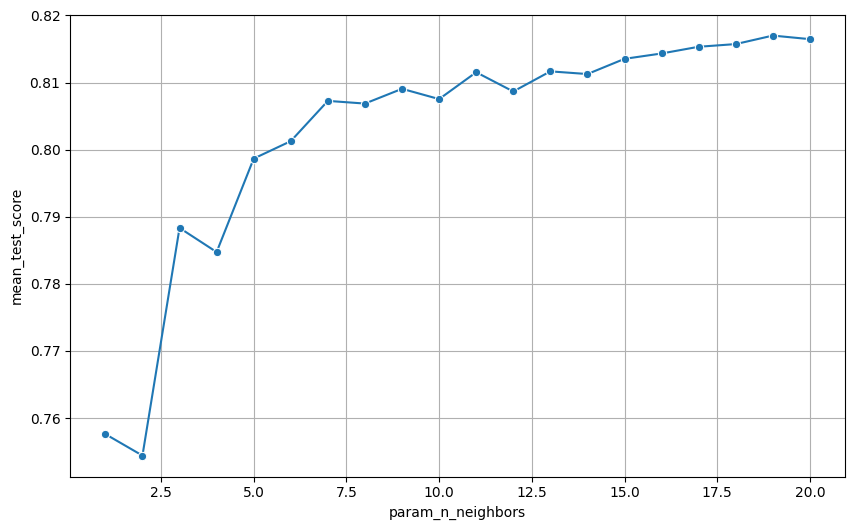

In [303]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=hist_df, x="param_n_neighbors", y="mean_test_score", marker='o', )
plt.grid(True)